# Generative Adversarial Text-to-Image Synthesis

## 1. Initialisation

#### 1.1 Imports

In [21]:
!pip install -q h5py==3.12.1
!pip install -q ipykernel==6.29.5
!pip install -q ipython==8.31.0
!pip install -q matplotlib==3.10.0
!pip install -q numpy==2.2.1
!pip install -q torch==2.6.0
!pip install -q torchvision==0.21.0
!pip install -q scikit-learn==1.6.1
!pip install -q plotly==6.0.0
!pip install -q gdown==5.2.0
!pip install -q tqdm==4.67.1

In [1]:
import os
import random
import io
from pathlib import Path

import numpy as np
from PIL import Image

import torch
import torchvision

from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import h5py
import plotly.graph_objects as go
from tqdm.notebook import tqdm, trange

#### 1.2 Seeds settings

In [2]:
manualSeed = 42
random.seed(manualSeed)
torch.manual_seed(manualSeed)
# torch.use_deterministic_algorithms(True)

MODEL_NO = 1

#### 1.3 Dataset installation

In [ ]:
!gdown 1VyNdHziY9avuv2_e3JG7LuW5hdkvv6hX
!unzip -q data.zip

#### 1.4 Path Settings

In [4]:
# Path to input data
PATH_TO_DATA_DIR = Path("./data")
PATH_TO_IMG_DIR = str(PATH_TO_DATA_DIR / "images")
PATH_TO_TEXTEMBD_DIR = str(PATH_TO_DATA_DIR / "text_c10")

# Path to output
PATH_FOR_OUTPUT = Path("./output")
PATH_FOR_MODEL = PATH_FOR_OUTPUT / f"models_{MODEL_NO}"
PATH_FOR_LOG = PATH_FOR_OUTPUT / f"logs_{MODEL_NO}"
PATH_FOR_TSNE = PATH_FOR_OUTPUT / f"tsne_{MODEL_NO}"

PATH_FOR_OUTPUT.mkdir(parents=True, exist_ok=True)
PATH_FOR_MODEL.mkdir(parents=True, exist_ok=True)
PATH_FOR_LOG.mkdir(parents=True, exist_ok=True)
PATH_FOR_TSNE.mkdir(parents=True, exist_ok=True)

#### 1.5 Hyperparameters

In [5]:
BATCH_SIZE = 64

EPOCHS = 30
LEARNING_RATE_GE = 5e-5
LEARNING_RATE_D = 1e-4
IMG_SIZE = 128

# Global variable
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

## 2. Dataset and Dataloader

#### 2.1 FlowerDataset Class

In [6]:
class FlowerDataset(torch.utils.data.Dataset):
    """
    Custom dataset class for the Oxford-102 dataset
    """
    def __init__(self, img_dir: str,
                 textembd_dir: str,
                 classes: list,
                 transform=None
                 ) -> None:
        """
        Initialize the dataset
        Args:
            img_dir (str): path to the directory containing the images
            textembd_dir (str): path to the directory containing the text embeddings
            classes (list): list of classes to be considered
            transform (torchvision.transforms.Compose): transforms to be applied to the
                images
        Attributes:
            img_dir (str): path to the directory containing the images
            textembd_dir (str): path to the directory containing the text embeddings
            classes (list): list of classes to be considered
            transform (torchvision.transforms.Compose): transforms to be applied to the
                images
            data (list): list of tuples containing the image path, text embedding and class
        """
        self.img_dir = img_dir
        self.textembd_dir = textembd_dir
        self.classes = classes
        self.transform = transform
        self.data = []

        for cl in classes:
            # go to the directory of the class
            textembd_path = os.path.join(textembd_dir, cl)
            # all the files in the directory with .h5 extension
            textembd_files = [f for f in os.listdir(
                textembd_path) if f.endswith('.h5')]
            for textembd_file in textembd_files:
                img_path = os.path.join(
                    img_dir, textembd_file.replace('.h5', '.jpg'))
                embd_path = os.path.join(textembd_path, textembd_file)
                if os.path.exists(img_path) and os.path.exists(embd_path):
                    with h5py.File(embd_path, 'r') as f:
                        keys = list(f.keys())
                        for key in keys:
                            emb = f[key][()]
                            # different datapoint for each image, textembd pair
                            self.data.append((img_path, emb, cl))

    def __len__(self) -> int:
        """
        Return the length of the dataset
        Returns:
            int: length of the dataset
        """
        return len(self.data)

    def __getitem__(self, idx) -> tuple[torch.Tensor, torch.Tensor, torch.Tensor]:
        """
        Get the item at the given index
        Args:
            idx (int): index of the item
        Returns:
            tuple[torch.Tensor, torch.Tensor, torch.Tensor]:
            tuple containing the image, text embedding and class
        """
        img_path, textembd, cl = self.data[idx]
        img = Image.open(img_path).convert('RGB')
        if self.transform:
            img = self.transform(img)
        textembd = torch.tensor(textembd)
        cl = int(cl[-5:])
        cl = torch.tensor(cl)
        return img, textembd, cl


def custom_collate_fn(batch) -> tuple[torch.Tensor, torch.Tensor, torch.Tensor]:
    """
    Custom collate function for the dataloader
    Args:
        batch (list): list of tuples containing the image, text embedding and class
    Returns:
        tuple[torch.Tensor, torch.Tensor, torch.Tensor]:
        tuple containing the images, text embeddings and classes
    """
    imgs, text_embs, cl = zip(*batch)

    imgs = torch.stack(imgs, dim=0)
    # pad the text embeddings to make them of the same length (328)
    padded_text_embs = []
    for emb in text_embs:
        pad_length = 328 - emb.shape[0]
        padded_emb = torch.nn.functional.pad(
            emb, (0, pad_length), mode='constant', value=0)
        padded_text_embs.append(padded_emb)
    padded_text_embs = torch.stack(padded_text_embs, dim=0)
    cl = torch.tensor(cl)

    imgs = imgs.float()
    padded_text_embs = padded_text_embs.float()
    cl = cl.float()

    return imgs, padded_text_embs, cl

#### 2.2 Class Split for Train-Test

In [7]:
# list of all classes in the dataset
with open(PATH_TO_DATA_DIR / "allclasses.txt") as f:
    classes = f.read().splitlines()

# train and validation split
random.shuffle(classes)
train_classes = classes[:20]
val_classes = classes[20:25]

#### 2.3 Load Dataset

In [8]:
# define parameters for data loading
tf = torchvision.transforms.Compose([
    torchvision.transforms.Resize((IMG_SIZE, IMG_SIZE)),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

train_dataset = FlowerDataset(
    img_dir=PATH_TO_IMG_DIR,
    textembd_dir=PATH_TO_TEXTEMBD_DIR,
    classes=train_classes,
    transform=tf
)
val_dataset = FlowerDataset(
    img_dir=PATH_TO_IMG_DIR,
    textembd_dir=PATH_TO_TEXTEMBD_DIR,
    classes=val_classes,
    transform=tf
)

#### 2.4 Create DataLoader

In [9]:
train_loader = torch.utils.data.DataLoader(
    dataset=train_dataset,
    batch_size=BATCH_SIZE,
    collate_fn=custom_collate_fn,
    shuffle=True
)
val_loader = torch.utils.data.DataLoader(
    dataset=val_dataset,
    batch_size=BATCH_SIZE,
    collate_fn=custom_collate_fn,
    shuffle=True
)

## 3. Source Encoder

#### 3.1 SrcEncoder Class

In [10]:
class SrcEncoder(torch.nn.Module):
    """
    Encoder to encode the source image to a representation
    """

    def __init__(self,
                 in_channels=3,
                 base_channels=64):
        """
        Initialize the encoder
        Args:
            in_channels (int): number of channels in the input image
            base_channels (int): number of channels in the first layer of the
                encoder
        Attributes:
            layer1: first layer of the encoder
            layer2: second layer of the encoder
            layer3: third layer of the encoder
            layer4: fourth layer of the encoder
            layer4_5: fifth layer of the encoder
        """
        super(SrcEncoder, self).__init__()
        # converts (3 x IMG_SIZE x IMG_SIZE) to (base_channels x IMG_SIZE/2 x IMG_SIZE/2)
        self.layer1 = torch.nn.Sequential(
            torch.nn.Conv2d(in_channels=in_channels, out_channels=base_channels,
                            kernel_size=4, stride=2, padding=1),
            torch.nn.LeakyReLU(0.2, inplace=True)
        )
        # converts (base_channels x IMG_SIZE/2 x IMG_SIZE/2) to (base_channels * 2 x IMG_SIZE/4 x IMG_SIZE/4)
        self.layer2 = torch.nn.Sequential(
            torch.nn.Conv2d(in_channels=base_channels, out_channels=base_channels *
                            2, kernel_size=4, stride=2, padding=1),
            torch.nn.BatchNorm2d(base_channels * 2),
            torch.nn.LeakyReLU(0.2, inplace=True)
        )
        # converts (base_channels * 2 x IMG_SIZE/4 x IMG_SIZE/4) to (base_channels * 4 x IMG_SIZE/8 x IMG_SIZE/8)
        self.layer3 = torch.nn.Sequential(
            torch.nn.Conv2d(in_channels=base_channels * 2,
                            out_channels=base_channels * 4, kernel_size=4, stride=2, padding=1),
            torch.nn.BatchNorm2d(base_channels * 4),
            torch.nn.LeakyReLU(0.2, inplace=True)
        )
        # converts (base_channels * 4 x IMG_SIZE/8 x IMG_SIZE/8) to (base_channels * 8 x IMG_SIZE/16 x IMG_SIZE/16)
        self.layer4 = torch.nn.Sequential(
            torch.nn.Conv2d(in_channels=base_channels * 4,
                            out_channels=base_channels * 8, kernel_size=4, stride=2, padding=1),
            torch.nn.BatchNorm2d(base_channels * 8),
            torch.nn.LeakyReLU(0.2, inplace=True)
        )
        # converts (base_channels * 8 x IMG_SIZE/16 x IMG_SIZE/16) to (base_channels * 8 x IMG_SIZE/16 x IMG_SIZE/16)
        # !!!!!! identity layer !!!!!!
        self.layer4_5 = torch.nn.Sequential(
            torch.nn.Conv2d(in_channels=base_channels * 8,
                            out_channels=base_channels * 8, kernel_size=3, stride=1, padding=1),
            torch.nn.BatchNorm2d(base_channels * 8),
            torch.nn.LeakyReLU(0.2, inplace=True)
        )

    def forward(self, x):
        """
        Forward pass of the encoder
        Converts (3 x IMG_SIZE x IMG_SIZE) to (base_channels * 8 x IMG_SIZE/16 x IMG_SIZE/16)
        Args:
            x (torch.Tensor): input tensor
        Returns:
            torch.Tensor: output tensor
        """
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        # !!!!!! apply layer 4.5 twice to improve the representation !!!!!!
        x = self.layer4_5(x)
        x = self.layer4_5(x)
        return x

#### 3.2 SrcEncoder Class Testing

In [11]:
# test the encoder on random data
encoder = SrcEncoder(in_channels=3, base_channels=64).to(DEVICE)
random_input_tensor = torch.randn(1, 3, IMG_SIZE, IMG_SIZE).to(DEVICE)
output_tensor = encoder(random_input_tensor)
print(output_tensor.shape)

torch.Size([1, 512, 8, 8])


## 4. Generator

#### 4.1 Generator Class

In [12]:
class Generator(torch.nn.Module):
    """
    Generator to generate an image from the encoded representation and text embedding
    """

    def __init__(self,
                 in_channels=512 + 328,
                 base_channels=128):
        """
        Initialize the generator
        Args:
            in_channels (int): number of channels in the input tensor
            base_channels (int): number of channels in the first layer of the generator
        Attributes:
            deconv0_5: first layer of the generator
            deconv1: second layer of the generator
            deconv2: third layer of the generator
            deconv3: fourth layer of the generator
            final: final layer of the generator
        """
        super(Generator, self).__init__()
        # converts (batch_size x in_channels x 8 x 8) to (batch_size x base_channels x 8 x 8)
        self.deconv0_5 = torch.nn.Sequential(
            torch.nn.Conv2d(in_channels=in_channels,
                            out_channels=base_channels, kernel_size=1),
            torch.nn.BatchNorm2d(base_channels),
            torch.nn.ReLU(inplace=True)
        )
        # converts (batch_size x base_channels x 8 x 8) to (batch_size x base_channels x 16 x 16)
        self.deconv1 = torch.nn.Sequential(
            torch.nn.ConvTranspose2d(
                in_channels=base_channels, out_channels=base_channels, kernel_size=4, stride=2, padding=1),
            torch.nn.BatchNorm2d(base_channels),
            torch.nn.ReLU(inplace=True)
        )
        # converts (batch_size x base_channels x 16 x 16) to (batch_size x base_channels x 32 x 32)
        self.deconv2 = torch.nn.Sequential(
            torch.nn.ConvTranspose2d(
                in_channels=base_channels, out_channels=base_channels // 2, kernel_size=4, stride=2, padding=1),
            torch.nn.BatchNorm2d(base_channels // 2),
            torch.nn.ReLU(inplace=True)
        )
        # converts (batch_size x base_channels x 32 x 32) to (batch_size x base_channels // 2 x 64 x 64)
        self.deconv3 = torch.nn.Sequential(
            torch.nn.ConvTranspose2d(in_channels=base_channels // 2,
                                     out_channels=base_channels // 4, kernel_size=4, stride=2, padding=1),
            torch.nn.BatchNorm2d(base_channels // 4),
            torch.nn.ReLU(inplace=True)
        )
        # converts (batch_size x base_channels // 4 x 64 x 64) to (batch_size x 3 x 128 x 128)
        self.deconv4 = torch.nn.Sequential(
            torch.nn.ConvTranspose2d(
                base_channels//4, base_channels//8, 4, 2, 1),
            torch.nn.BatchNorm2d(base_channels//8),
            torch.nn.ReLU(inplace=True)
        )
        # converts (batch_size x base_channels // 8 x 128 x 128) to (batch_size x 3 x 128 x 128)
        self.final = torch.nn.Sequential(
            torch.nn.Conv2d(in_channels=base_channels // 8,
                            out_channels=3, kernel_size=3, padding=1),
            torch.nn.Tanh()
        )

    def forward(self, img, txt):
        """
        Forward pass of the generator
        Converts (batch_size x in_channels x 8 x 8) to (batch_size x 3 x 128 x 128)
        Args:
            img (torch.Tensor): input image tensor
            txt (torch.Tensor): input text embedding tensor
        Returns:
            torch.Tensor: output tensor
        """
        txt = txt.unsqueeze(2).unsqueeze(3)
        txt = txt.expand(-1, -1, img.size(2), img.size(3))
        x = torch.cat([img, txt], dim=1)
        x = self.deconv0_5(x)
        x = self.deconv1(x)
        x = self.deconv2(x)
        x = self.deconv3(x)
        x = self.deconv4(x)
        x = self.final(x)
        return x

#### 4.2 Generator Class Testing

In [13]:
# Test the modified generator
gen = Generator(base_channels=256).to(DEVICE)
random_img_tensor = torch.randn(1, 512, 8, 8).to(DEVICE)
random_txt_tensor = torch.randn(1, 328).to(DEVICE)
output_tensor = gen(random_img_tensor, random_txt_tensor)
print(output_tensor.shape)

torch.Size([1, 3, 128, 128])


## 5. Discriminator

#### 5.1 Discriminator Class

In [14]:
class Discriminator(torch.nn.Module):
    """
    Discriminator to classify the images as real or fake
    """

    def __init__(self,
                 base_channels=64):
        """
        Initialize the discriminator
        Args:
            base_channels (int): number of channels in the first layer of the discriminator
        Attributes:
            layer1: first layer of the discriminator
            layer2: second layer of the discriminator
            layer3: third layer of the discriminator
            layer4: fourth layer of the discriminator
            final: final layer of the discriminator
            out_act: output activation
        """
        super(Discriminator, self).__init__()
        # converts (3 x 128 x 128) to (base_channels x 64 x 64)
        self.layer1 = torch.nn.Sequential(
            torch.nn.Conv2d(3, base_channels, 4, 2, 1),
            torch.nn.LeakyReLU(0.2, True)
        )
        # converts (base_channels x 64 x 64) to (base_channels*2 x 32 x 32)
        self.layer2 = torch.nn.Sequential(
            torch.nn.Conv2d(base_channels, base_channels*2, 4, 2, 1),
            torch.nn.BatchNorm2d(base_channels*2),
            torch.nn.LeakyReLU(0.2, True)
        )
        # converts (base_channels*2 x 32 x 32) to (base_channels*4 x 16 x 16)
        self.layer3 = torch.nn.Sequential(
            torch.nn.Conv2d(base_channels*2, base_channels*4, 4, 2, 1),
            torch.nn.BatchNorm2d(base_channels*4),
            torch.nn.LeakyReLU(0.2, True)
        )
        # converts (base_channels*4 x 16 x 16) to (base_channels*8 x 8 x 8)
        self.layer4 = torch.nn.Sequential(
            torch.nn.Conv2d(base_channels*4, base_channels*8, 4,
                            1, 1),  # stride=1 for final patch map
            torch.nn.BatchNorm2d(base_channels*8),
            torch.nn.LeakyReLU(0.2, True)
        )
        # converts (base_channels*8 x 8 x 8) to (1 x 14 x 14)
        # !!!!!! Not a single value, but a 14x14 patch map to account regional differences !!!!!!
        self.final = torch.nn.Conv2d(base_channels*8, 1, 4, 1, 1)
        self.out_act = torch.nn.Sigmoid()

    def forward(self, x):
        """
        Forward pass of the discriminator
        Converts (3 x 128 x 128) to (1 x 14 x 14)
        Args:
            x (torch.Tensor): input tensor
        Returns:
            torch.Tensor: output tensor
        """
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        x = self.final(x)
        x = self.out_act(x)
        return x

#### 5.2 Discriminator Class Testing

In [15]:
# test the encoder on random data
disc = Discriminator(base_channels=64).to(DEVICE)
random_input_tensor = torch.randn(1, 3, IMG_SIZE, IMG_SIZE).to(DEVICE)
output_tensor = disc(random_input_tensor)
print(output_tensor.shape)

torch.Size([1, 1, 14, 14])


## 6. Train

#### 6.1 Visualisation Function

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.5398955..2.6739776].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.6683605..2.5127392].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.4142838..2.6810076].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.4102911..2.4151897].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.5084095..2.5883634].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.5325449..2.6772707].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.635697

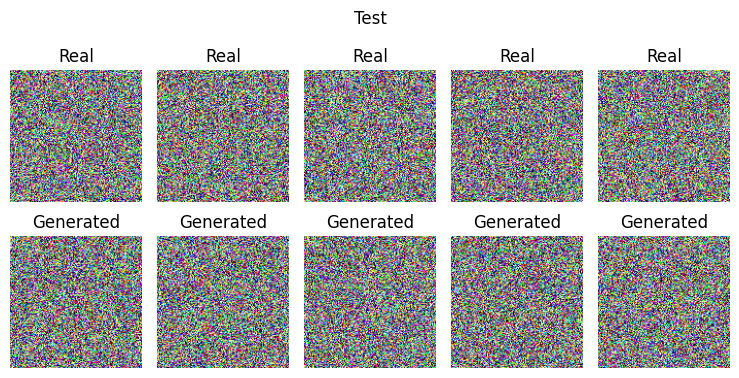

In [16]:
def visualise(real_images,
              fake_images,
              title=None,
              save_copy=True):
    """
    Display real images in top row (5 columns) and fake images in bottom row (5 columns)
    with discriminator probabilities.
    Args:
        real_images (torch.Tensor): real images
        fake_images (torch.Tensor): fake images
        title (str): title of the plot
    """
    num_samples = min(len(real_images), 5)
    fig, ax = plt.subplots(2, num_samples, figsize=(7.5, 4))
    plt.suptitle(title)
    
    real_images = (real_images + 1) / 2
    fake_images = (fake_images + 1) / 2
    
    for i in range(num_samples):
        ax[0, i].imshow(real_images[i].permute(1, 2, 0).cpu().detach().numpy())
        ax[0, i].set_title(f"Real")
        ax[0, i].axis("off")
    
    for i in range(num_samples):
        ax[1, i].imshow(fake_images[i].permute(1, 2, 0).cpu().detach().numpy())
        ax[1, i].set_title(f"Generated")
        ax[1, i].axis("off")
    
    plt.tight_layout()
    if save_copy:
        plt.savefig(PATH_FOR_LOG / f"{title}.png")
    plt.show()
    
visualise(torch.randn(5, 3, IMG_SIZE, IMG_SIZE), torch.randn(5, 3, IMG_SIZE, IMG_SIZE), "Test", save_copy=False)

#### 6.2 Train model

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/276 [00:00<?, ?it/s]

Epoch 1/30 | Avg Train D Loss: 0.93122 | Avg Train G&E Loss: 1.62097


  0%|          | 0/52 [00:00<?, ?it/s]

Validation | Avg D Loss: 1.09315 | Avg G&E Loss: 0.96395


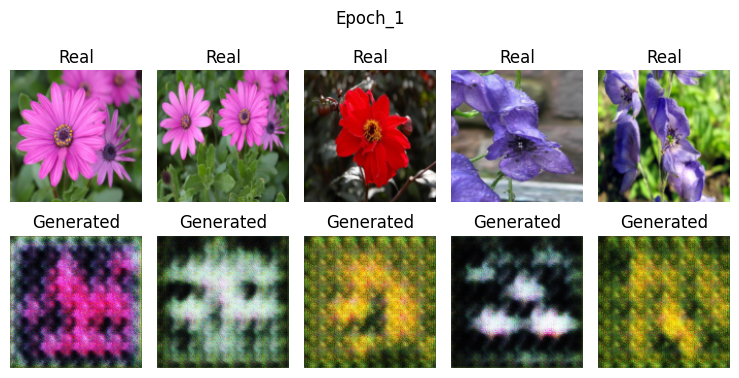

  0%|          | 0/276 [00:00<?, ?it/s]

Epoch 2/30 | Avg Train D Loss: 1.09312 | Avg Train G&E Loss: 1.25777


  0%|          | 0/52 [00:00<?, ?it/s]

Validation | Avg D Loss: 1.32264 | Avg G&E Loss: 0.90273


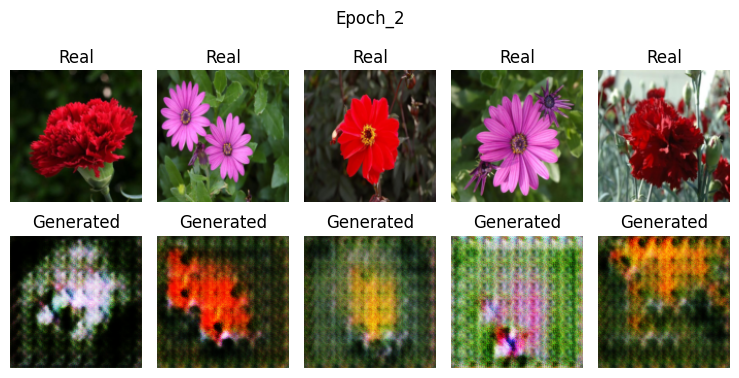

  0%|          | 0/276 [00:00<?, ?it/s]

Epoch 3/30 | Avg Train D Loss: 1.10816 | Avg Train G&E Loss: 1.26978


  0%|          | 0/52 [00:00<?, ?it/s]

Validation | Avg D Loss: 1.20927 | Avg G&E Loss: 0.96712


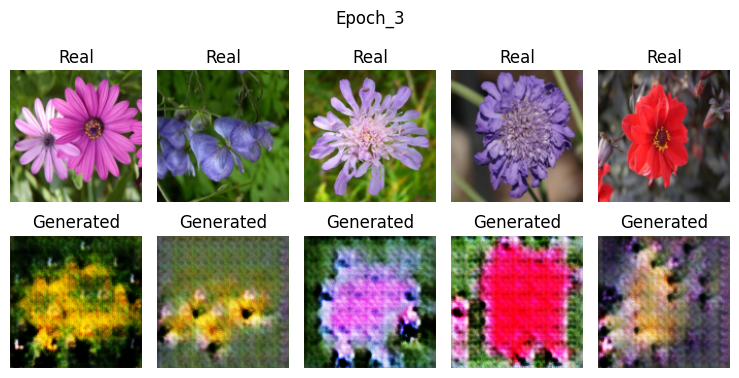

  0%|          | 0/276 [00:00<?, ?it/s]

Epoch 4/30 | Avg Train D Loss: 1.09792 | Avg Train G&E Loss: 1.32056


  0%|          | 0/52 [00:00<?, ?it/s]

Validation | Avg D Loss: 1.21222 | Avg G&E Loss: 0.88119


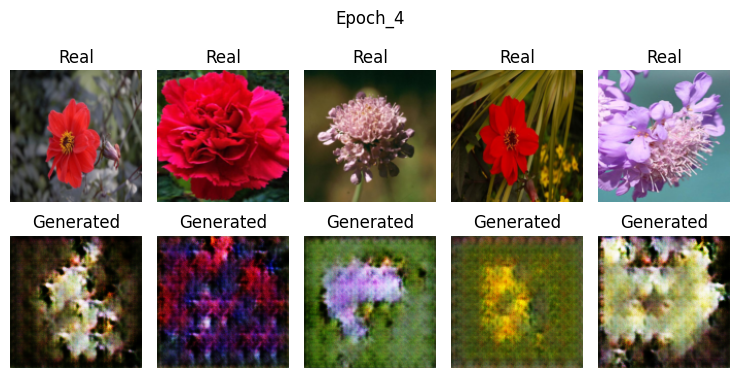

  0%|          | 0/276 [00:00<?, ?it/s]

Epoch 5/30 | Avg Train D Loss: 1.06793 | Avg Train G&E Loss: 1.36666


  0%|          | 0/52 [00:00<?, ?it/s]

Validation | Avg D Loss: 1.23573 | Avg G&E Loss: 1.14765


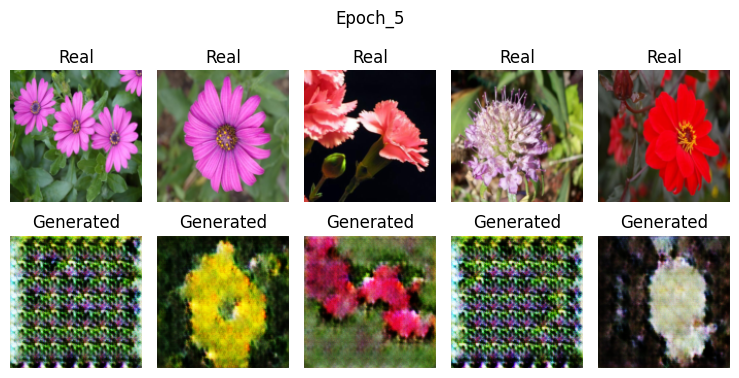

  0%|          | 0/276 [00:00<?, ?it/s]

Epoch 6/30 | Avg Train D Loss: 1.04974 | Avg Train G&E Loss: 1.39592


  0%|          | 0/52 [00:00<?, ?it/s]

Validation | Avg D Loss: 1.09381 | Avg G&E Loss: 1.10250


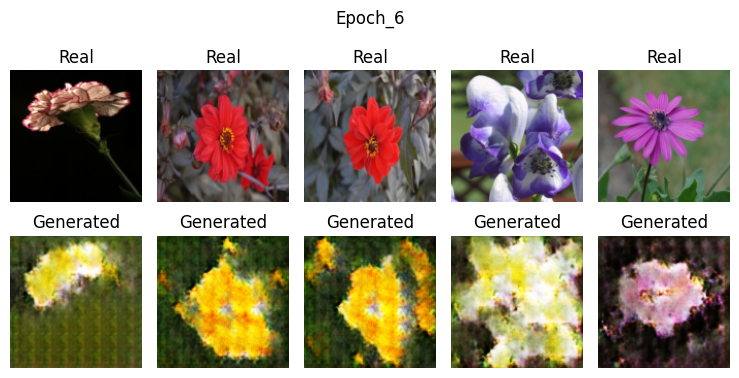

  0%|          | 0/276 [00:00<?, ?it/s]

Epoch 7/30 | Avg Train D Loss: 1.06294 | Avg Train G&E Loss: 1.37721


  0%|          | 0/52 [00:00<?, ?it/s]

Validation | Avg D Loss: 1.26308 | Avg G&E Loss: 0.89836


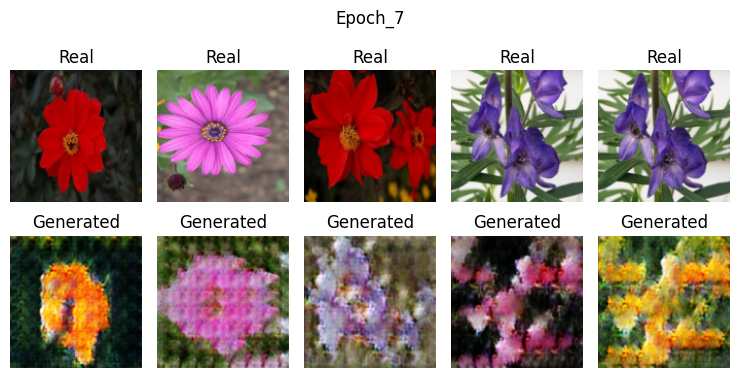

  0%|          | 0/276 [00:00<?, ?it/s]

Epoch 8/30 | Avg Train D Loss: 1.07045 | Avg Train G&E Loss: 1.42574


  0%|          | 0/52 [00:00<?, ?it/s]

Validation | Avg D Loss: 1.17591 | Avg G&E Loss: 1.10429


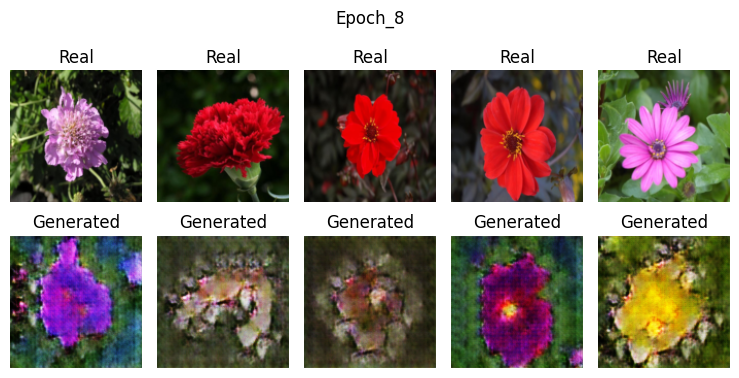

  0%|          | 0/276 [00:00<?, ?it/s]

Epoch 9/30 | Avg Train D Loss: 1.02221 | Avg Train G&E Loss: 1.39529


  0%|          | 0/52 [00:00<?, ?it/s]

Validation | Avg D Loss: 1.21450 | Avg G&E Loss: 1.11641


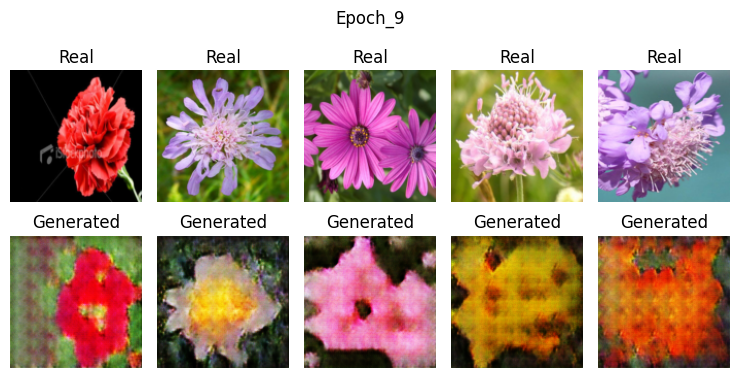

  0%|          | 0/276 [00:00<?, ?it/s]

Epoch 10/30 | Avg Train D Loss: 1.02784 | Avg Train G&E Loss: 1.42305


  0%|          | 0/52 [00:00<?, ?it/s]

Validation | Avg D Loss: 1.13908 | Avg G&E Loss: 1.05587


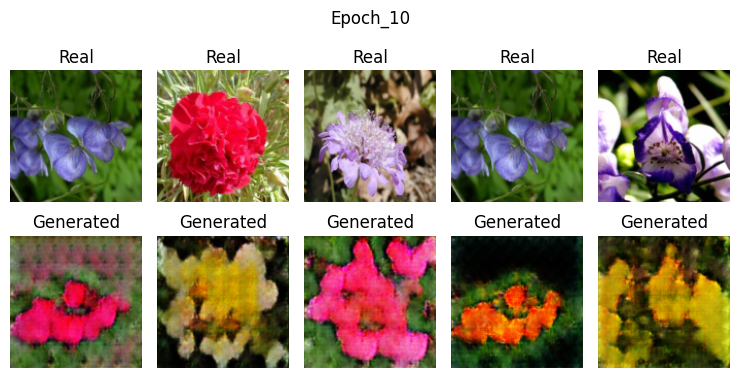

  0%|          | 0/276 [00:00<?, ?it/s]

Epoch 11/30 | Avg Train D Loss: 1.02830 | Avg Train G&E Loss: 1.39101


  0%|          | 0/52 [00:00<?, ?it/s]

Validation | Avg D Loss: 1.15707 | Avg G&E Loss: 0.85987


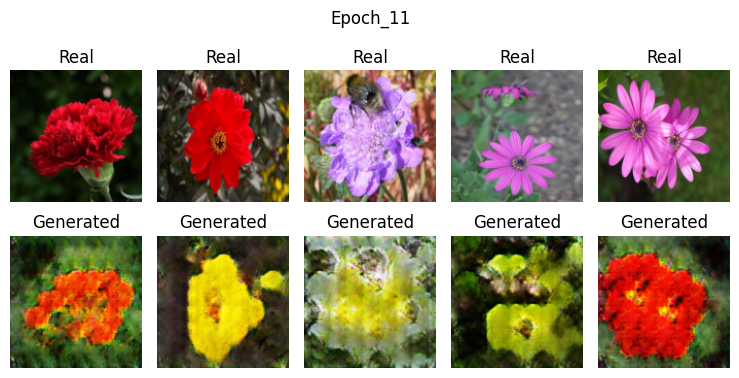

  0%|          | 0/276 [00:00<?, ?it/s]

Epoch 12/30 | Avg Train D Loss: 1.03232 | Avg Train G&E Loss: 1.38404


  0%|          | 0/52 [00:00<?, ?it/s]

Validation | Avg D Loss: 1.12114 | Avg G&E Loss: 1.06982


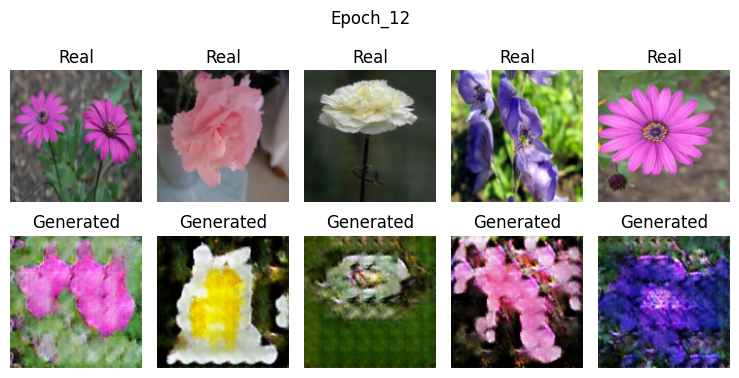

  0%|          | 0/276 [00:00<?, ?it/s]

Epoch 13/30 | Avg Train D Loss: 0.99420 | Avg Train G&E Loss: 1.42470


  0%|          | 0/52 [00:00<?, ?it/s]

Validation | Avg D Loss: 1.08526 | Avg G&E Loss: 1.07954


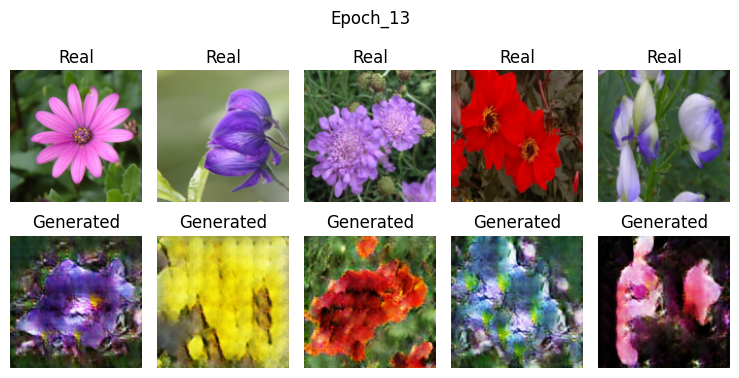

  0%|          | 0/276 [00:00<?, ?it/s]

Epoch 14/30 | Avg Train D Loss: 1.02040 | Avg Train G&E Loss: 1.44279


  0%|          | 0/52 [00:00<?, ?it/s]

Validation | Avg D Loss: 1.16949 | Avg G&E Loss: 1.29520


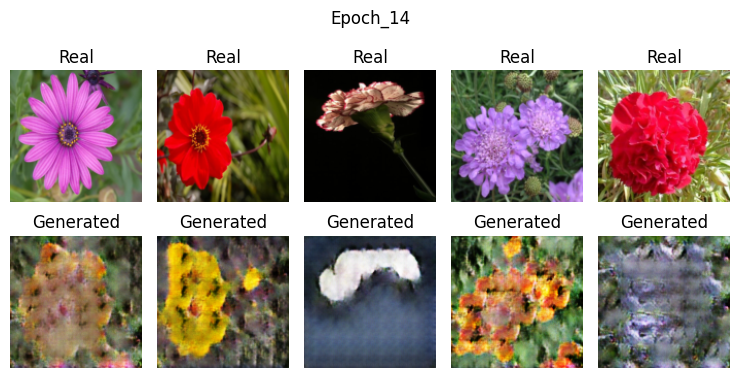

  0%|          | 0/276 [00:00<?, ?it/s]

Epoch 15/30 | Avg Train D Loss: 0.97472 | Avg Train G&E Loss: 1.45184


  0%|          | 0/52 [00:00<?, ?it/s]

Validation | Avg D Loss: 1.20465 | Avg G&E Loss: 1.12156


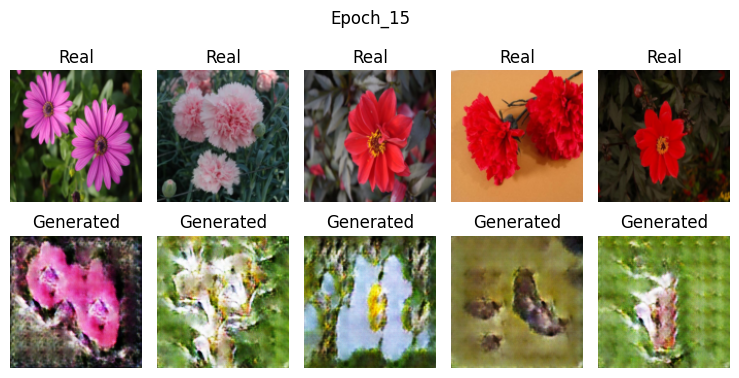

  0%|          | 0/276 [00:00<?, ?it/s]

Epoch 16/30 | Avg Train D Loss: 1.00110 | Avg Train G&E Loss: 1.48349


  0%|          | 0/52 [00:00<?, ?it/s]

Validation | Avg D Loss: 1.18327 | Avg G&E Loss: 1.34919


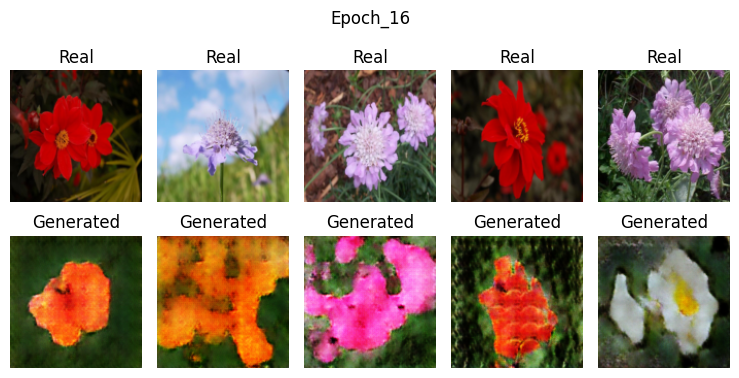

  0%|          | 0/276 [00:00<?, ?it/s]

Epoch 17/30 | Avg Train D Loss: 0.96397 | Avg Train G&E Loss: 1.50049


  0%|          | 0/52 [00:00<?, ?it/s]

Validation | Avg D Loss: 1.34726 | Avg G&E Loss: 0.84608


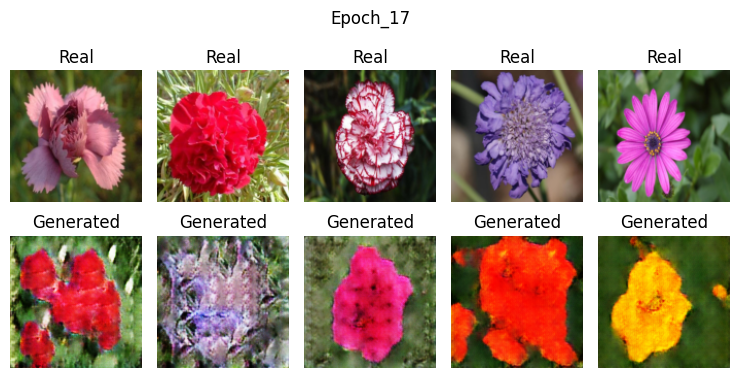

  0%|          | 0/276 [00:00<?, ?it/s]

Epoch 18/30 | Avg Train D Loss: 0.99489 | Avg Train G&E Loss: 1.47964


  0%|          | 0/52 [00:00<?, ?it/s]

Validation | Avg D Loss: 1.13835 | Avg G&E Loss: 0.99100


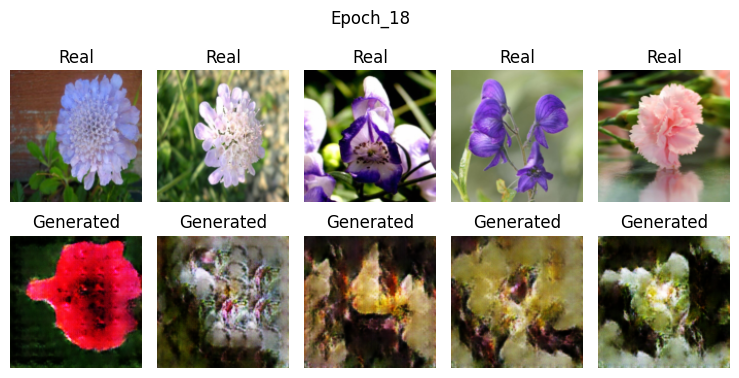

  0%|          | 0/276 [00:00<?, ?it/s]

Epoch 19/30 | Avg Train D Loss: 0.97154 | Avg Train G&E Loss: 1.54911


  0%|          | 0/52 [00:00<?, ?it/s]

Validation | Avg D Loss: 1.19483 | Avg G&E Loss: 1.40486


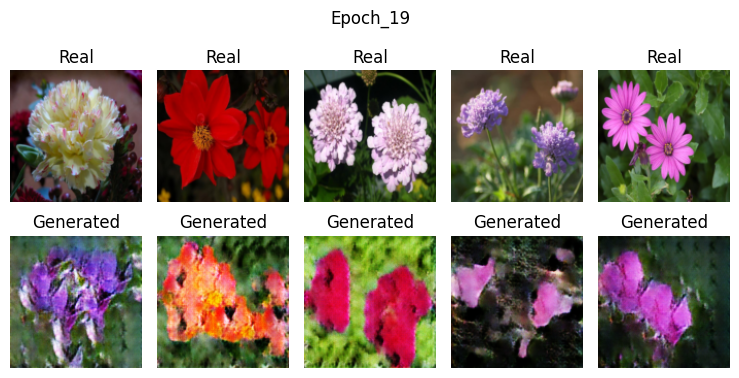

  0%|          | 0/276 [00:00<?, ?it/s]

Epoch 20/30 | Avg Train D Loss: 0.93264 | Avg Train G&E Loss: 1.60443


  0%|          | 0/52 [00:00<?, ?it/s]

Validation | Avg D Loss: 1.17453 | Avg G&E Loss: 1.16013


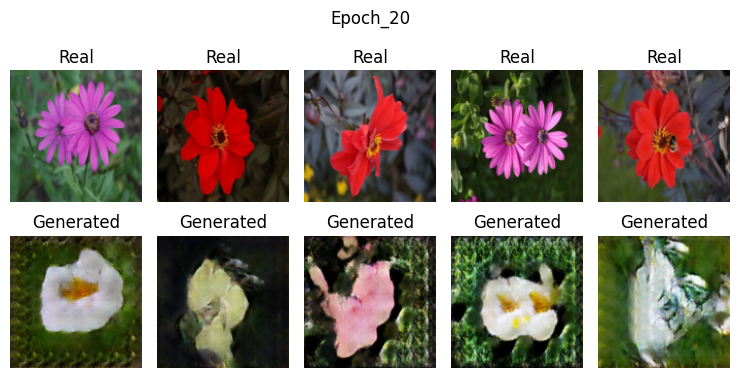

  0%|          | 0/276 [00:00<?, ?it/s]

Epoch 21/30 | Avg Train D Loss: 0.95955 | Avg Train G&E Loss: 1.60322


  0%|          | 0/52 [00:00<?, ?it/s]

Validation | Avg D Loss: 1.12894 | Avg G&E Loss: 1.36082


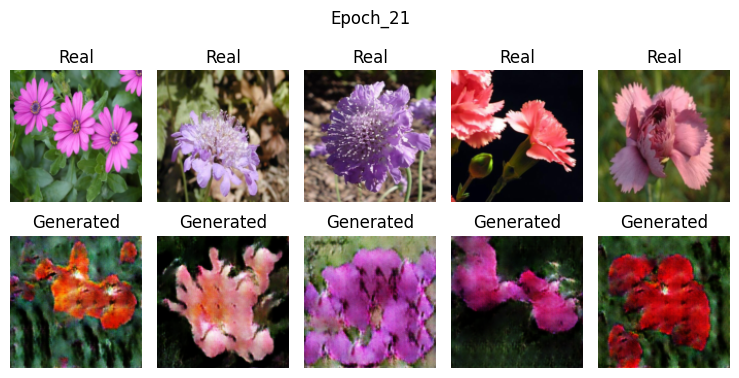

  0%|          | 0/276 [00:00<?, ?it/s]

Epoch 22/30 | Avg Train D Loss: 0.91097 | Avg Train G&E Loss: 1.60264


  0%|          | 0/52 [00:00<?, ?it/s]

Validation | Avg D Loss: 1.11416 | Avg G&E Loss: 1.16868


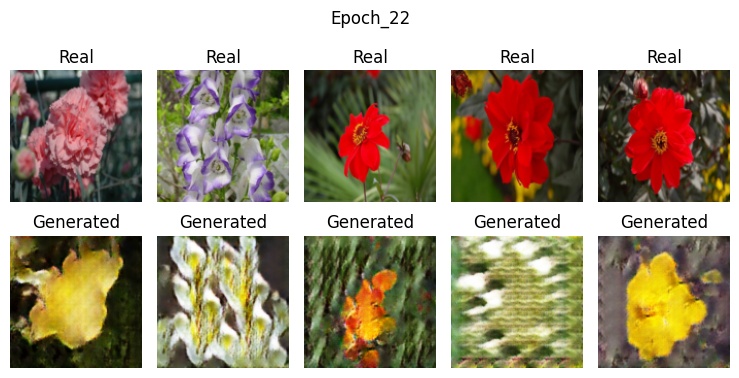

  0%|          | 0/276 [00:00<?, ?it/s]

Epoch 23/30 | Avg Train D Loss: 0.97423 | Avg Train G&E Loss: 1.58981


  0%|          | 0/52 [00:00<?, ?it/s]

Validation | Avg D Loss: 1.16260 | Avg G&E Loss: 1.07403


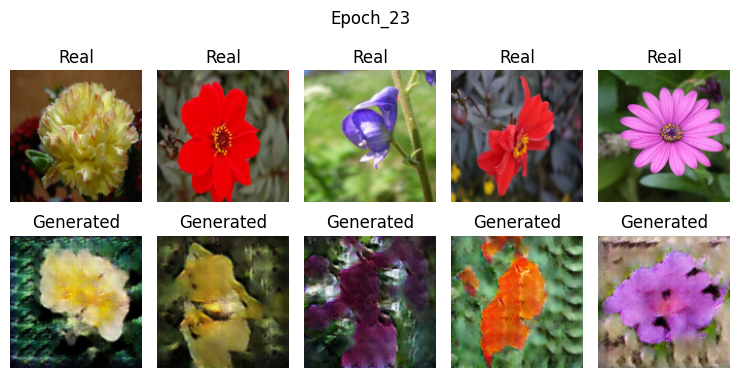

  0%|          | 0/276 [00:00<?, ?it/s]

Epoch 24/30 | Avg Train D Loss: 0.90715 | Avg Train G&E Loss: 1.63082


  0%|          | 0/52 [00:00<?, ?it/s]

Validation | Avg D Loss: 1.11277 | Avg G&E Loss: 1.22985


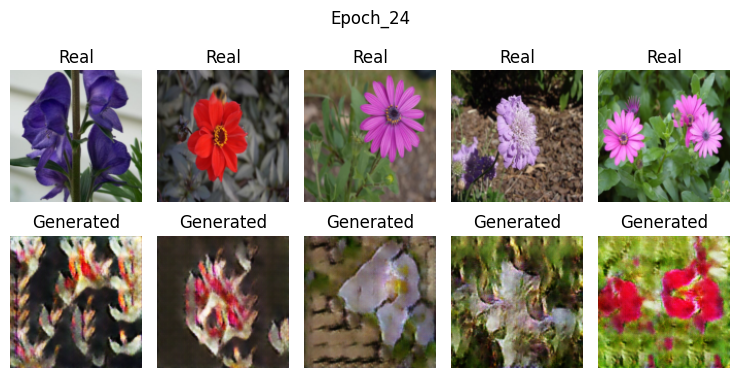

  0%|          | 0/276 [00:00<?, ?it/s]

Epoch 25/30 | Avg Train D Loss: 0.98327 | Avg Train G&E Loss: 1.60019


  0%|          | 0/52 [00:00<?, ?it/s]

Validation | Avg D Loss: 1.10583 | Avg G&E Loss: 1.33923


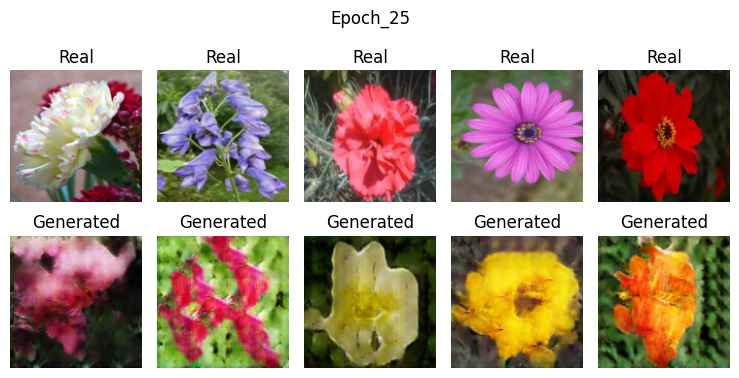

  0%|          | 0/276 [00:00<?, ?it/s]

Epoch 26/30 | Avg Train D Loss: 0.89674 | Avg Train G&E Loss: 1.65145


  0%|          | 0/52 [00:00<?, ?it/s]

Validation | Avg D Loss: 1.07192 | Avg G&E Loss: 1.13423


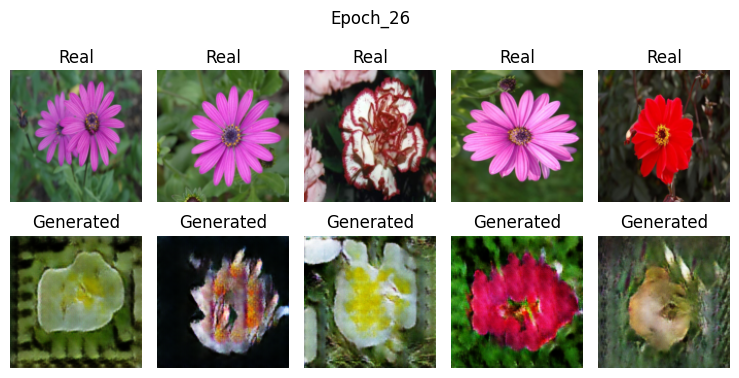

  0%|          | 0/276 [00:00<?, ?it/s]

Epoch 27/30 | Avg Train D Loss: 0.90085 | Avg Train G&E Loss: 1.67773


  0%|          | 0/52 [00:00<?, ?it/s]

Validation | Avg D Loss: 1.20111 | Avg G&E Loss: 0.95464


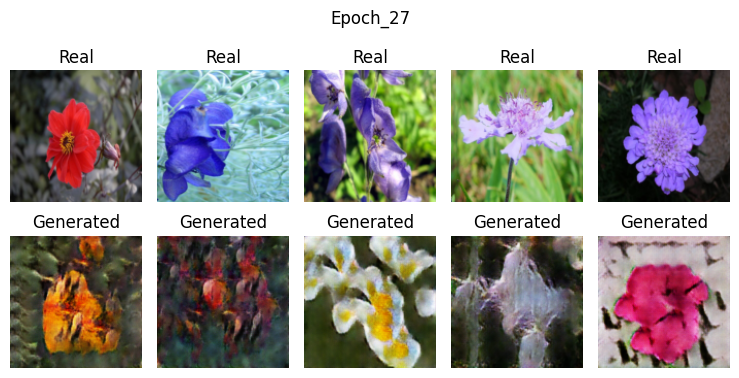

  0%|          | 0/276 [00:00<?, ?it/s]

Epoch 28/30 | Avg Train D Loss: 0.87090 | Avg Train G&E Loss: 1.71319


  0%|          | 0/52 [00:00<?, ?it/s]

Validation | Avg D Loss: 1.12297 | Avg G&E Loss: 1.16331


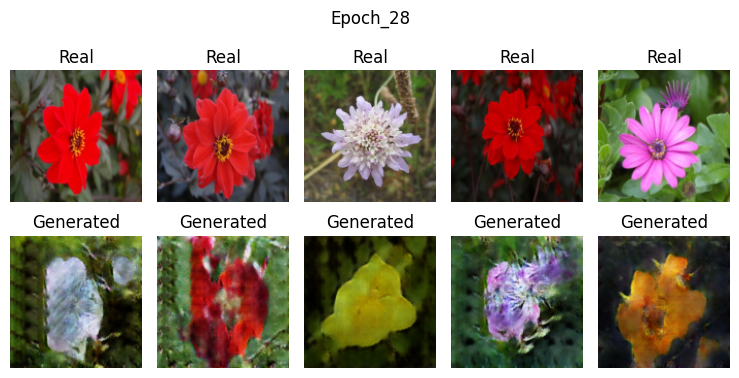

  0%|          | 0/276 [00:00<?, ?it/s]

Epoch 29/30 | Avg Train D Loss: 0.96838 | Avg Train G&E Loss: 1.75886


  0%|          | 0/52 [00:00<?, ?it/s]

Validation | Avg D Loss: 1.32029 | Avg G&E Loss: 1.05805


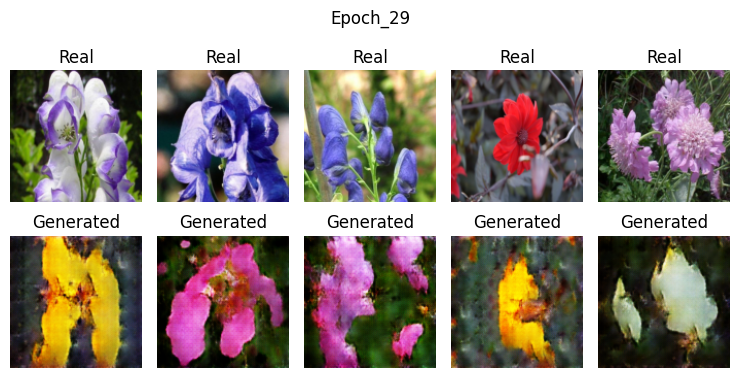

  0%|          | 0/276 [00:00<?, ?it/s]

Epoch 30/30 | Avg Train D Loss: 0.86719 | Avg Train G&E Loss: 1.65574


  0%|          | 0/52 [00:00<?, ?it/s]

Validation | Avg D Loss: 1.17094 | Avg G&E Loss: 1.23595


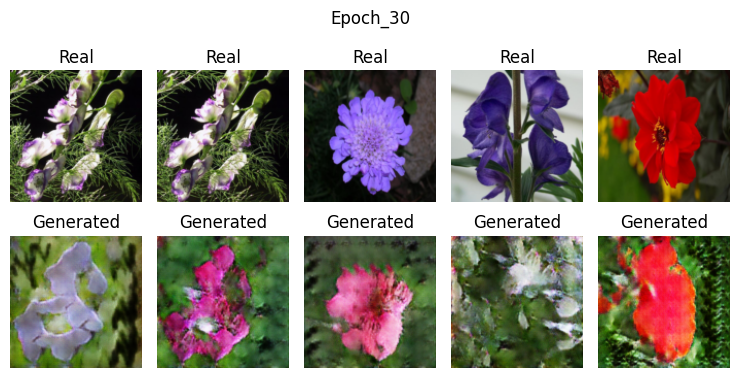

Training complete.


In [17]:
# Initialize models:
encoder = SrcEncoder(in_channels=3, base_channels=64).to(DEVICE)
generator = Generator(base_channels=256).to(DEVICE)
discriminator = Discriminator(base_channels=64).to(DEVICE)

train_d_losses = []
train_ge_losses = []
val_d_losses = []
val_ge_losses = []

# !!!!!! BCE Loss !!!!!!
criterion = torch.nn.BCELoss()

# Optimizers: discriminator separately, generator and encoder jointly.
optimizer_D = torch.optim.Adam(discriminator.parameters(
), lr=LEARNING_RATE_D, betas=(0.5, 0.999), weight_decay=1e-5)
optimizer_GE = torch.optim.Adam(list(generator.parameters(
)) + list(encoder.parameters()), lr=LEARNING_RATE_GE, betas=(0.5, 0.999), weight_decay=1e-5)


def train():
    """
    Training loop for the GAN
    """
    for epoch in trange(1, EPOCHS + 1):

        # ------------------ Training Loop ------------------ #
        encoder.train()
        generator.train()
        discriminator.train()

        running_d_loss = 0.0
        running_ge_loss = 0.0

        for __, (img, txt, _) in tqdm(enumerate(train_loader), total=len(train_loader), leave=False):
            real_img = img.to(DEVICE)
            txt = txt.to(DEVICE)
            batch_size = real_img.size(0)

            with torch.no_grad():
                prob_real = discriminator(real_img)
            # !!!!!!!!!!!!!!!! Label Smoothing !!!!!!!!!!!!!!!!! #
            real_labels = torch.full_like(prob_real, 0.9)
            fake_labels = torch.full_like(prob_real, 0.1)

            ## ----- Train Discriminator ----- ##
            optimizer_D.zero_grad()

            repr_of_img = encoder(real_img)
            fake_img = generator(repr_of_img, txt)

            prob_real = discriminator(real_img)
            prob_fake = discriminator(fake_img.detach())

            d_loss_real = criterion(prob_real, real_labels)
            d_loss_fake = criterion(prob_fake, fake_labels)
            d_loss = d_loss_real + d_loss_fake

            d_loss.backward()
            optimizer_D.step()

            ## ----- Jointly Train Generator and Encoder ----- ##
            optimizer_GE.zero_grad()
            repr_of_img = encoder(real_img)
            fake_img = generator(repr_of_img, txt)
            prob_fake = discriminator(fake_img)

            ge_loss = criterion(prob_fake, real_labels)

            ge_loss.backward()
            optimizer_GE.step()

            running_d_loss += d_loss.item()
            running_ge_loss += ge_loss.item()

        avg_d_loss = running_d_loss / len(train_loader)
        avg_ge_loss = running_ge_loss / len(train_loader)
        train_d_losses.append(avg_d_loss)
        train_ge_losses.append(avg_ge_loss)

        print(
            f"Epoch {epoch}/{EPOCHS} | Avg Train D Loss: {avg_d_loss:.5f} | Avg Train G&E Loss: {avg_ge_loss:.5f}")

        # ------------------ Validation Loop ------------------ #
        encoder.eval()
        generator.eval()
        discriminator.eval()

        running_d_loss_val = 0.0
        running_ge_loss_val = 0.0

        with torch.no_grad():
            for batch_idx, (img, txt, _) in tqdm(enumerate(val_loader), total=len(val_loader), leave=False):
                real_img = img.to(DEVICE)
                txt = txt.to(DEVICE)
                batch_size = real_img.size(0)

                prob_real = discriminator(real_img)

                real_labels_val = torch.full_like(prob_real, 0.9)
                fake_labels_val = torch.full_like(prob_real, 0.1)

                repr_of_img = encoder(real_img)
                fake_img = generator(repr_of_img, txt)

                prob_real = discriminator(real_img)
                prob_fake = discriminator(fake_img.detach())

                d_loss_real_val = criterion(prob_real, real_labels_val)
                d_loss_fake_val = criterion(prob_fake, fake_labels_val)
                d_loss_val = d_loss_real_val + d_loss_fake_val

                repr_of_img = encoder(real_img)
                fake_img = generator(repr_of_img, txt)
                prob_fake_val = discriminator(fake_img)
                ge_loss_val = criterion(prob_fake_val, real_labels_val)

                running_d_loss_val += d_loss_val.item()
                running_ge_loss_val += ge_loss_val.item()

            avg_d_loss_val = running_d_loss_val / len(val_loader)
            avg_ge_loss_val = running_ge_loss_val / len(val_loader)
            val_d_losses.append(avg_d_loss_val)
            val_ge_losses.append(avg_ge_loss_val)

        print(
            f"Validation | Avg D Loss: {avg_d_loss_val:.5f} | Avg G&E Loss: {avg_ge_loss_val:.5f}")

        # ------------------ Visualization using your visualise() function ------------------ #
        with torch.no_grad():
            for i, (img, txt, _) in enumerate(val_loader):
                real_img_vis = img.to(DEVICE)
                txt_vis = txt.to(DEVICE)
                repr_vis = encoder(real_img_vis)
                fake_img_vis = generator(repr_vis, txt_vis)
                visualise(real_img_vis, fake_img_vis, "Epoch_" + str(epoch))
                break

        torch.cuda.empty_cache()

    print("Training complete.")


train()

#### 6.3 Loss plot

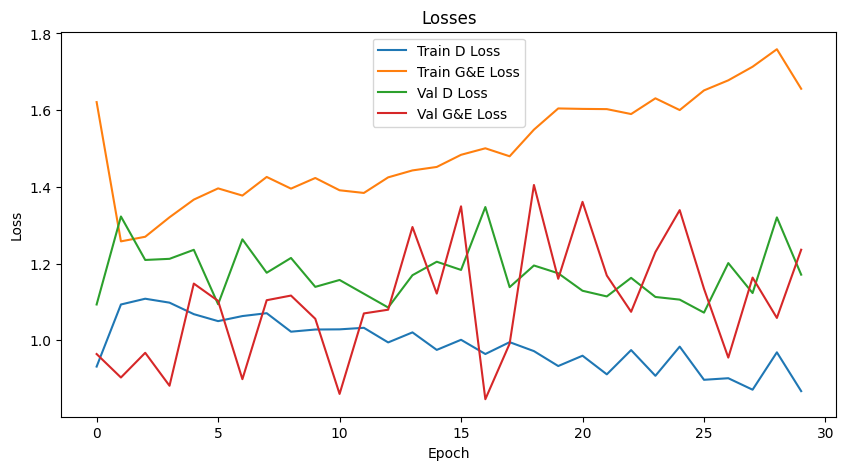

<Figure size 640x480 with 0 Axes>

In [18]:
def plot_errors():
    """
    Plot the errors
    """
    # plot losses
    plt.figure(figsize=(10, 5))
    plt.plot(train_d_losses, label="Train D Loss")
    plt.plot(train_ge_losses, label="Train G&E Loss")
    plt.plot(val_d_losses, label="Val D Loss")
    plt.plot(val_ge_losses, label="Val G&E Loss")
    plt.title("Losses")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()
    # save plot
    plt.savefig(PATH_FOR_LOG / "losses.png")
    
plot_errors()

#### 6.4 Save Model

In [19]:
# save model
torch.save(encoder.state_dict(), PATH_FOR_MODEL / "encoder.pth")
torch.save(generator.state_dict(), PATH_FOR_MODEL / "generator.pth")
torch.save(discriminator.state_dict(), PATH_FOR_MODEL / "discriminator.pth")
print("Models saved.")

Models saved.


## 7. Testing

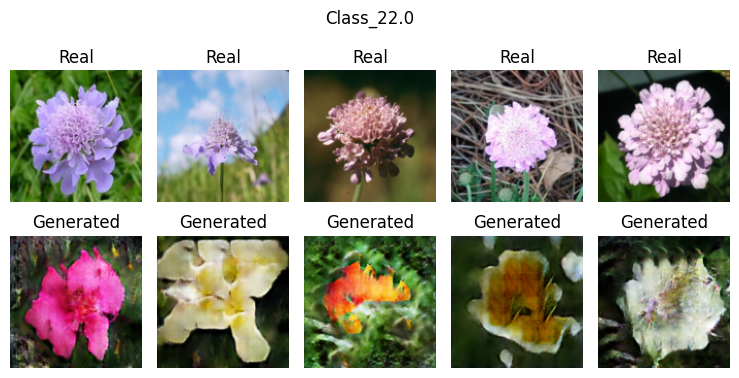

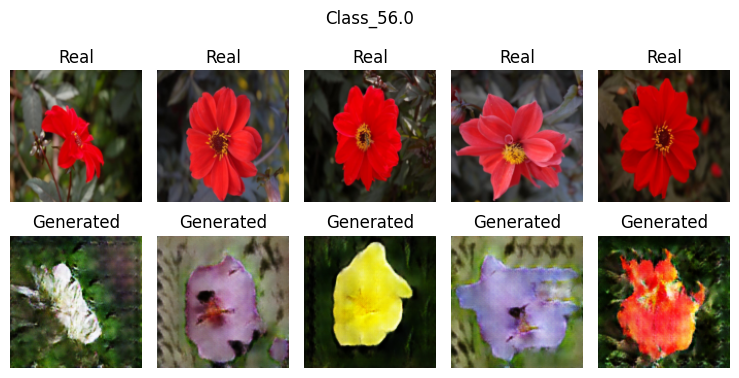

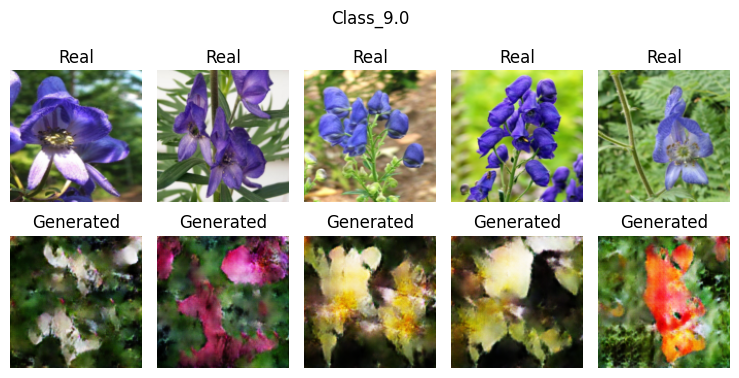

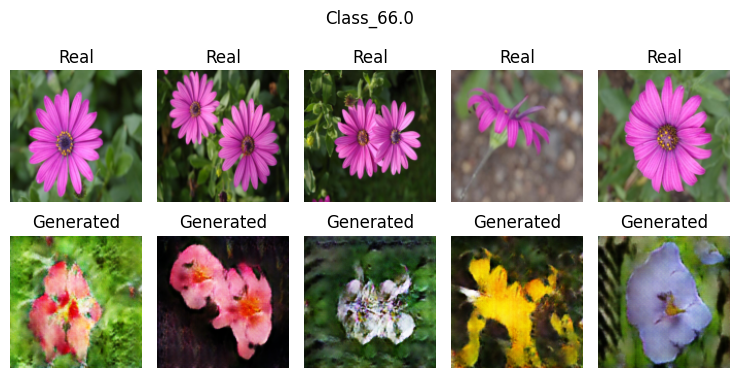

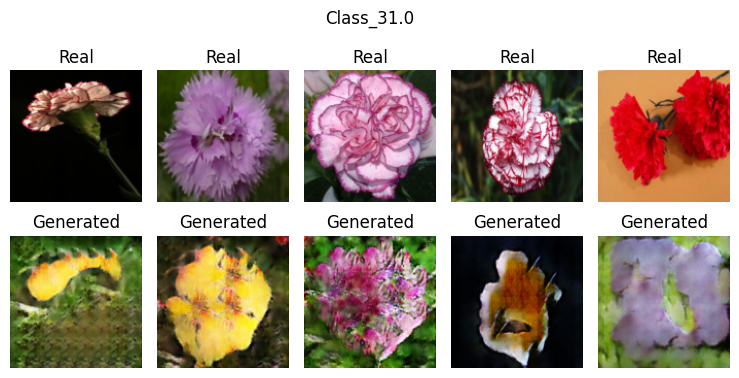

Class-wise visualisation complete.


  0%|          | 0/25 [00:00<?, ?it/s]

t-SNE plot saved.
Model metrics:
Model              Total Params     Trainable Params Model Size (MB)
Encoder               5,119,168            5,119,168           19.55
Generator             1,954,819            1,954,819            7.47
Discriminator         2,766,529            2,766,529           10.57
Testing complete.
Testing complete.


In [ ]:
encoder = SrcEncoder(in_channels=3, base_channels=64).to(DEVICE)
generator = Generator(base_channels=256).to(DEVICE)
discriminator = Discriminator(base_channels=64).to(DEVICE)

encoder.load_state_dict(torch.load(PATH_FOR_MODEL / "encoder.pth"))
generator.load_state_dict(torch.load(PATH_FOR_MODEL / "generator.pth"))
discriminator.load_state_dict(torch.load(PATH_FOR_MODEL / "discriminator.pth"))


def test_1():
    """
    Visualise 5 images from each class
    """
    cls_img = {}
    for _, (img, txt, cl) in enumerate(val_loader):
        cl = cl.cpu().numpy()
        for i in range(len(cl)):
            if cl[i] not in cls_img:
                cls_img[cl[i]] = []
            if len(cls_img[cl[i]]) < 5:
                cls_img[cl[i]].append((img[i], txt[i]))
        if all(len(v) >= 5 for v in cls_img.values()):
            break

    for cl, img_txt in cls_img.items():
        img_batch = torch.stack([it[0] for it in img_txt], dim=0).to(DEVICE)
        txt_batch = torch.stack([it[1] for it in img_txt], dim=0).to(DEVICE)
        repr_batch = encoder(img_batch)
        fake_img_batch = generator(repr_batch, txt_batch)
        visualise(img_batch, fake_img_batch, "Class_" + str(cl))
    print("Class-wise visualisation complete.")


def test_2():
    """
    3D-tSNE plot of embeddings of SrcEncoder
    """
    def get_encoder_embeddings(dataset, encoder, device):
        """
        Get embeddings from encoder for all images in dataset.
        """
        encoder.eval()
        embeddings = []
        labels = []
        n = len(dataset)
        with torch.no_grad():
            for i in range(n):
                img, _, cl = dataset[i]
                img = img.unsqueeze(0).to(device)
                emb = encoder(img)
                embeddings.append(emb.cpu().numpy())
                labels.append(cl)
        embeddings = np.array(embeddings).squeeze()
        labels = np.array(labels)
        return embeddings, labels

    train_embeddings, train_labels = get_encoder_embeddings(
        train_dataset, encoder, DEVICE)
    val_embeddings, val_labels = get_encoder_embeddings(
        val_dataset, encoder, DEVICE)

    all_embeddings = np.concatenate([train_embeddings, val_embeddings], axis=0)
    all_labels = np.concatenate([train_labels, val_labels], axis=0)
    all_embeddings = all_embeddings.reshape(all_embeddings.shape[0], -1)

    tsne = TSNE(n_components=3, perplexity=30, random_state=42)
    tsne_result = tsne.fit_transform(all_embeddings)

    if isinstance(all_labels[0], str):
        unique_labels = np.unique(all_labels)
        label_map = {lbl: idx for idx, lbl in enumerate(unique_labels)}
        numeric_labels = np.array([label_map[lbl] for lbl in all_labels])
    else:
        numeric_labels = np.array(all_labels)

    fig = go.Figure()
    for lbl in tqdm(np.unique(numeric_labels), leave=False):
        idx = numeric_labels == lbl
        fig.add_trace(go.Scatter3d(
            x=tsne_result[idx, 0],
            y=tsne_result[idx, 1],
            z=tsne_result[idx, 2],
            mode='markers',
            marker=dict(size=4, opacity=0.7),
            name=f"Class {lbl}",
            text=[f"Label: {all_labels[i]}" for i in range(
                len(all_labels)) if idx[i]],
        ))
    fig.update_layout(
        title="Interactive 3D t-SNE of Source Encoder Embeddings",
        scene=dict(
            xaxis_title="t-SNE 1",
            yaxis_title="t-SNE 2",
            zaxis_title="t-SNE 3"
        ),
        margin=dict(l=0, r=0, b=0, t=40)
    )
    fig.write_html(PATH_FOR_TSNE / "tsne_plot.html")
    print("t-SNE plot saved.")


def test_3():
    """
    Model Metrics
    """
    models = {
        'Encoder': encoder,
        'Generator': generator,
        'Discriminator': discriminator
    }
    print("Model metrics:")
    print("{:<15} {:>15} {:>20} {:>15}".format(
        "Model", "Total Params", "Trainable Params", "Model Size (MB)"))
    for name, model in models.items():
        total_params = sum(p.numel() for p in model.parameters())
        trainable_params = sum(p.numel()
                               for p in model.parameters() if p.requires_grad)
        buffer = io.BytesIO()
        torch.save(model.state_dict(), buffer)
        size_in_bytes = buffer.getbuffer().nbytes
        model_size = size_in_bytes / (1024 ** 2)
        print("{:<15} {:>15,} {:>20,} {:>15.2f}".format(
            name, total_params, trainable_params, model_size))


def test():
    """
    Testing loop for the GAN
    1. Visualise 5 images from each class
    2. 3D-tSNE plot of embeddings of SrcEncoder
    3. Model Metrics
    """
    random.seed()
    test_1()
    test_2()
    test_3()

    print("Testing complete.")
    
test()